# Spatial Clustering and Regionalization

__Learning Outcomes__
* query geodemographic data from US Census Bureau API
* implement clustering or segmentation models
* implement regionalization models
* cluster profiling
* measure model performance

In [1]:
# Import the requisite packages
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd

import warnings
warnings.filterwarnings('ignore')

## Importing and cleaning New York City geodemographic data

### Extracting data using the Census API

#### 1. Import packages
* _census_ package: access data form US Census Bureau using their API
* _us_ package: for working with US and state-level metadata, which inlcudes info such as FIPS codes and URLs to their shapefiles

In [2]:
from census import Census 
from us import states 

#### 2. Query Census API

In [3]:
# Set API key
#c = Census("CENSUS API KEY HERE")

# import API key
import json
with open('../../_api_keys.json', 'r', encoding='utf-8') as f:
    api_keys = json.load(f)

c = Census(api_keys['us_census'])

#### 3. Specify relevant variables and query API

In [4]:
# Grabbing a few variables of interest pertaining to the economic vitality of an area
geo_demo = [
    "B01003_001E", #"Total Population"
    "B25077_001E", #"Median value of owner occupied units"
    "B25026_001E", #"Total population in occupied housing units"
    "B25008_002E", #"Total number of owner occupied units"
    "B25008_003E", #"Total number of renter occupied units"
    "B06009_002E", #"Population with less than a high school diploma"
    "B06009_003E", #"Population with high school diploma or equivalent"
    "B06009_004E", #"Population with some college/associates degree"
    "B06009_005E", #"Population with bachelors degree"
    "B06009_006E", #"Population with a graduate degree"
    "B01002_001E", #"Median age"
    "B06010_004E", #"Population with income less than 9999"
    "B06010_005E", #"Population with income between 10000 and 14999"
    "B06010_006E", #"Population with income between 15000 and 24999"
    "B06010_007E", #"Population with income between 25000 and 34999"
    "B06010_008E", #"Population with income between 35000 and 49999"
    "B06010_009E", #"Population with income between 50000 and 64999"
    "B06010_010E", #"Population with income between 65000 and 74999"
    "B06010_011E", #"Population with income of 75000 or more"
    "B28007_009E", #"Population in labor force and unemployed"
    "B19059_002E", #"Population that is retired with retirement income"
    "B19059_003E", #"Retired without retirement income"
    "B08013_001E", #"Travel time to work in minutes"
    "B17013_002E" #"Population with income below poverty level in past 12 months"
        ]

In [5]:
# Sources: https://api.census.gov/data/2019/acs/acs5/variables.html; https://pypi.org/project/census/
ny_census = c.acs5.state_county_tract(fields = (['NAME'] +  geo_demo),
                                      state_fips = states.NY.fips,
                                      county_fips = "*",
                                      tract = "*",
                                      year = 2019)

In [6]:
# Create a dataframe from the census data
ny_df = pd.DataFrame(ny_census)

# Show the dataframe and its print its shape
display(ny_df.head(2))
print('Shape of NY DataFrame:', ny_df.shape)

,NAME,B01003_001E,B25077_001E,B25026_001E,B25008_002E,B25008_003E,B06009_002E,B06009_003E,B06009_004E,B06009_005E,...,B06010_010E,B06010_011E,B28007_009E,B19059_002E,B19059_003E,B08013_001E,B17013_002E,state,county,tract
0,"Census Tract 55, Onondaga County, New York",3563.0,92600.0,3558.0,476.0,3082.0,131.0,519.0,697.0,350.0,...,46.0,152.0,166.0,167.0,1653.0,28685.0,267.0,36,067,005500
1,"Census Tract 56.01, Onondaga County, New York",1599.0,147000.0,1591.0,1246.0,345.0,37.0,116.0,242.0,260.0,...,75.0,221.0,30.0,102.0,592.0,14155.0,0.0,36,067,005601


Shape of NY DataFrame: (4918, 28)


#### 4. Geo-enable the geodemographic data
* access shapefile of NY census tracts
* determine best projection for NY

In [7]:
# Access shapefile of NY census tracts
ny_tract = gpd.read_file("https://www2.census.gov/geo/tiger/TIGER2019/TRACT/tl_2019_36_tract.zip")

# Reprojecting the shapefile to the New York State Plan Long Island Zone 
# EPSG:2263 - https://spatialreference.org/ref/epsg/2263/
ny_tract = ny_tract.to_crs(epsg = 2263)

# Print GeoDataFrame of the NY census tract shapefile
display(ny_tract.head(2))
print('NY Tract Shape: ', ny_tract.shape)

# Check projection of the shapefile
print("\nThe shapefile projection for this data is: {}".format(ny_tract.crs))

,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,36,081,044800,36081044800,448,Census Tract 448,G5020,S,208002,0,+40.7110219,-073.8026344,"POLYGON ((1037906.015 198756.977, 1038155.154 ..."
1,36,081,045800,36081045800,458,Census Tract 458,G5020,S,245281,0,+40.7152626,-073.7909261,"POLYGON ((1041458.867 199407.403, 1041462.891 ..."


NY Tract Shape:  (4918, 13)

The shapefile projection for this data is: EPSG:2263


#### 5. Pre-process cencus data

In [8]:
# Combine the state, county, and tract variables of the ny_df together to create 
# a new string and assign to variable called GEOID

ny_df["GEOID"] = ny_df["state"] + ny_df["county"] + ny_df["tract"]

# Remove the individual columns as they're no longer needed
ny_df = ny_df.drop(columns = ["state", "county", "tract"])

# Display the updated dataframe
ny_df.head(2)

,NAME,B01003_001E,B25077_001E,B25026_001E,B25008_002E,B25008_003E,B06009_002E,B06009_003E,B06009_004E,B06009_005E,...,B06010_008E,B06010_009E,B06010_010E,B06010_011E,B28007_009E,B19059_002E,B19059_003E,B08013_001E,B17013_002E,GEOID
0,"Census Tract 55, Onondaga County, New York",3563.0,92600.0,3558.0,476.0,3082.0,131.0,519.0,697.0,350.0,...,401.0,156.0,46.0,152.0,166.0,167.0,1653.0,28685.0,267.0,36067005500
1,"Census Tract 56.01, Onondaga County, New York",1599.0,147000.0,1591.0,1246.0,345.0,37.0,116.0,242.0,260.0,...,240.0,246.0,75.0,221.0,30.0,102.0,592.0,14155.0,0.0,36067005601


#### 6. Join cencus data with census tract data

In [9]:
# Join the data together on GEOID to geoenable the census data
ny_merge = ny_tract.merge(ny_df, on = "GEOID")

# Display the results
ny_merge.head(2)

,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,B06010_007E,B06010_008E,B06010_009E,B06010_010E,B06010_011E,B28007_009E,B19059_002E,B19059_003E,B08013_001E,B17013_002E
0,36,081,044800,36081044800,448,Census Tract 448,G5020,S,208002,0,...,234.0,104.0,247.0,54.0,234.0,104.0,64.0,666.0,54320.0,117.0
1,36,081,045800,36081045800,458,Census Tract 458,G5020,S,245281,0,...,187.0,167.0,158.0,79.0,325.0,80.0,61.0,632.0,50275.0,18.0


---

## Cleaning the Data

In [10]:
# Renaming variables in the data set
ny_merge.rename(columns={
    "B01003_001E":"TotPop", #"Total Population"
    "B25077_001E":"MedVal_OwnOccUnit", #"Median value of owner occupied units"
    "B25026_001E":"TotPopOccUnits", #"Total population in occupied housing units"
    "B25008_002E":"TotNumOwnOccUnit", #"Total number of owner occupied units"
    "B25008_003E":"TotNumRentOccUnit", #"Total number of renter occupied units"
    "B06009_002E":"PopLTHSDip", #"Population with less than a high school diploma"
    "B06009_003E":"PopHSDip", #"Population with high school diploma or equivalent"
    "B06009_004E":"PopAssoc", #"Population with some college/associates degree"
    "B06009_005E":"PopBA", #"Population with bachelors degree"
    "B06009_006E":"PopGrad", #"Population with a graduate degree"
    "B01002_001E":"MedAge", #"Median age"
    "B06010_004E":"PopIncLT10", #"Population with income less than 9999"
    "B06010_005E":"PopInc1015", #"Population with income between 10000 and 14999"
    "B06010_006E":"PopInc1525", #"Population with income between 15000 and 24999"
    "B06010_007E":"PopInc2535", #"Population with income between 25000 and 34999"
    "B06010_008E":"PopInc3550", #"Population with income between 35000 and 49999"
    "B06010_009E":"PopInc5065", #"Population with income between 50000 and 64999"
    "B06010_010E":"PopInc6575", #"Population with income between 65000 and 74999"
    "B06010_011E":"PopIncGT75", #"Population with income of 75000 or more"
    "B28007_009E":"UnempPop", #"Population in labor force and unemployed"
    "B19059_002E":"RetPop", #"Population that is retired with retirement income"
    "B19059_003E":"RetPopNoRetInc", #"Retired without retirement income"
    "B08013_001E":"TrvTimWrk", #"Travel time to work in minutes"
    "B17013_002E":"PopBlwPovLvl" #"Population with income below poverty level in past 12 months"
}
                , inplace=True
               )

In [11]:
geo_demo_rn = [
"TotPop", #"Total Population"
"TotPopOccUnits", #"Total population in occupied housing units"
"TotNumOwnOccUnit", #"Total number of owner occupied units"
"TotNumRentOccUnit", #"Total number of renter occupied units"
"PopLTHSDip", #"Population with less than a high school diploma"
"PopHSDip", #"Population with high school diploma or equivalent"
"PopAssoc", #"Population with some college/associates degree"
"PopBA", #"Population with bachelors degree"
"PopGrad", #"Population with a graduate degree"
"PopIncLT10", #"Population with income less than 9999"
"PopInc1015", #"Population with income between 10000 and 14999"
"PopInc1525", #"Population with income between 15000 and 24999"
"PopInc2535", #"Population with income between 25000 and 34999"
"PopInc3550", #"Population with income between 35000 and 49999"
"PopInc5065", #"Population with income between 50000 and 64999"
"PopInc6575", #"Population with income between 65000 and 74999"
"PopIncGT75", #"Population with income of 75000 or more"
"UnempPop", #"Population in labor force and unemployed"
"RetPop", #"Population that is retired with retirement income"
"RetPopNoRetInc", #"Retired without retirement income"
"PopBlwPovLvl" #"Population with income below poverty level in past 12 months"
]

# Cleaning up the dataframe
geo_demo_rn.append('geometry')
ny_merge_2 = ny_merge[geo_demo_rn]
geo_demo_rn.remove('geometry')

In [12]:
# Dropping any areas without population
ny_merge_2 = ny_merge_2[ny_merge_2['TotPop']>0]

# Resetting the index to assist in index based operations later on
ny_merge_2.reset_index(inplace=True)

---

## Exploratory Data Analysis

#### 1. Visualize each variable

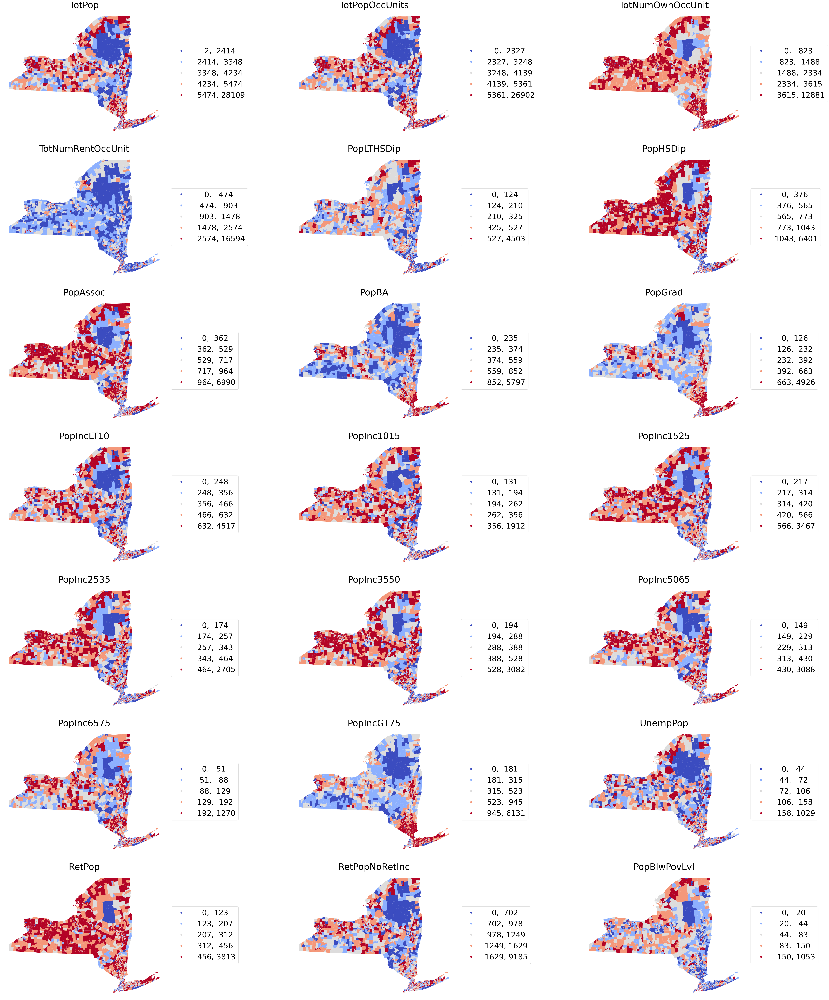

In [13]:
# Setting up the figure using subplots to map each of the extracted variables
fig, axes = plt.subplots(nrows=7, ncols=3, figsize=(75,75), layout='tight')

axes = axes.flatten()

# Setting the font size
plt.rcParams['font.size'] = '40'

# Plotting each of the extracted variables in a subplot
for ind, col in enumerate(geo_demo_rn):
    ax = axes[ind]
    ny_merge_2.plot(column=col,
                  ax = ax, scheme = "quantiles", linewidth=0, cmap="coolwarm", 
                    legend=True, legend_kwds={'loc': 'center left','bbox_to_anchor':(1,0.5),'fmt': "{:.0f}"}
                 ) 
    ax.set_axis_off()
    ax.set_title(col)
plt.subplots_adjust(wspace=None, hspace=None)
plt.show()

### 2. Testing for spatial autocorrelation

In [14]:
# Importing packages required for testing spatial autocorrelation
from libpysal.weights import Queen, KNN
from esda.moran import Moran
import numpy as np

In [15]:
## Calculate spatial weights matrix
w = Queen.from_dataframe(ny_merge_2)

In [16]:
## Calculate Moran's I statistic for each variable

# Set the numpy random seed for reproducibility
np.random.seed(54321)

# Calculate the Moran's I statistic for each geodemographic variable
moransi_results = [
    Moran(ny_merge_2[v], w) for v in geo_demo_rn
]

# Structure results as a list of tuples
moransi_results = [
    (v, res.I, res.p_sim)
    for v, res in zip(geo_demo_rn, moransi_results)
]

# Display as a table
table = pd.DataFrame(
    moransi_results, columns=["GEODEMO Var", "Moran's I", "P-value"]
).set_index("GEODEMO Var")

table#.head(5)

('WARNING: ', 296, ' is an island (no neighbors)')


,Moran's I,P-value
GEODEMO Var,,
TotPop,0.293936,0.001
TotPopOccUnits,0.285091,0.001
TotNumOwnOccUnit,0.577288,0.001
TotNumRentOccUnit,0.544159,0.001
PopLTHSDip,0.504985,0.001
PopHSDip,0.341330,0.001
PopAssoc,0.336799,0.001
PopBA,0.548469,0.001
PopGrad,0.631800,0.001


**_Interpretation_: there is spatial autocorrelation (positive)**

### 3. Distributions and correlations

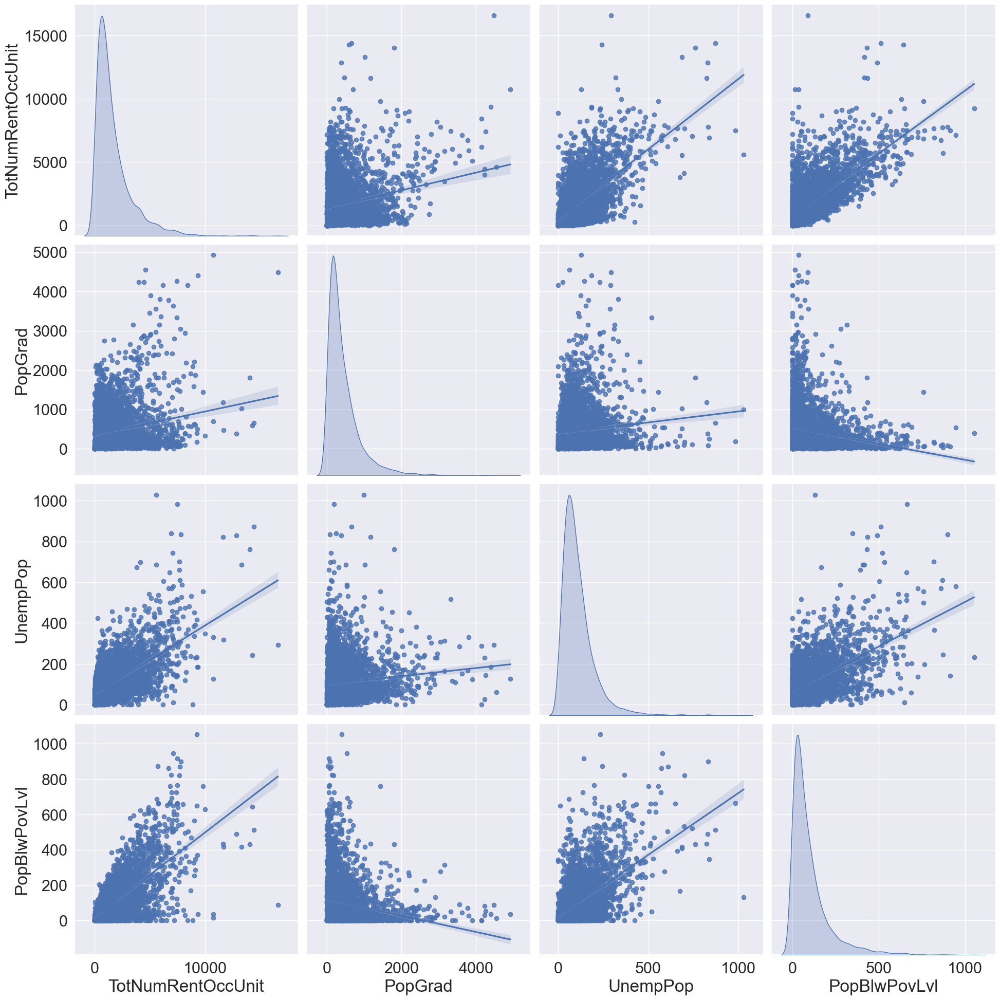

In [17]:
## Pairplots
# only 4 variables are shown for simplicity

# Importing packages required for additional visualization
import seaborn as sns
sns.set(font_scale=2)

# Given we have 25 variables in the data set to explore, this will be way to many plots to visually inspect. Lets inspect just a handful
sel_vars = [
    "TotNumRentOccUnit", #"Total number of renter occupied units"
    "PopGrad", #"Population with a graduate degree"
    "UnempPop", #"Population in labor force and unemployed"
    "PopBlwPovLvl" #"Population with income below poverty level in past 12 months"
]

pplt = sns.pairplot(
    ny_merge_2[sel_vars], kind="reg", diag_kind="kde",
    height=5, 
)

plt.show()

In [18]:
# Saving out the figure as an image
fig = pplt.fig
fig.savefig("NY_Pairplot.png")

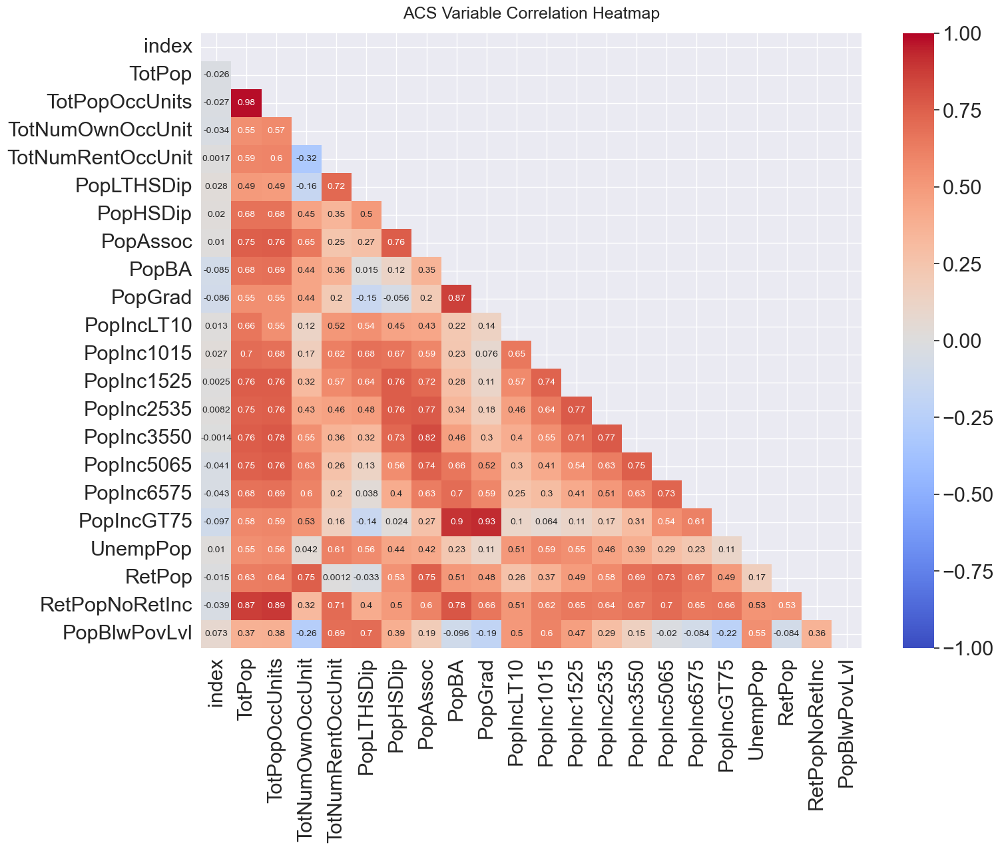

In [19]:
## Correlation Heatmap

# Set the figure size
plt.figure(figsize=(16, 12))

# Setting the font size
plt.rcParams['font.size'] = '10'

# Create the mask to only show the lower triangle
#mask = np.triu(ny_merge_2.iloc[:, :-1].corr(), dtype=np.bool)
#heatmap = sns.heatmap(ny_merge_2.iloc[:, :-1], mask=mask, vmin=-1, vmax=1, annot=True, cmap='coolwarm')
#heatmap.set_title('ACS Variable Correlation Heatmap', fontdict={'fontsize':18}, pad=16);

## ABOVE DID NOT WORK, MODIFICATIONS BELOW
corr = ny_merge_2.iloc[:, :-1].corr()
# Getting the Upper Triangle of the co-relation matrix
mask = np.triu(corr)
# using the upper triangle matrix as mask 
heatmap = sns.heatmap(corr, mask=mask, vmin=-1, vmax=1, annot=True, cmap='coolwarm')
heatmap.set_title('ACS Variable Correlation Heatmap', fontdict={'fontsize':18}, pad=16);

---

## Processing the data

In [20]:
## Scaling required by clustering algorithm

# Importing the packages needed to scale the data
from sklearn.preprocessing import robust_scale

ny_merged_scaled = robust_scale(ny_merge_2[geo_demo_rn])
ny_merged_scaled

array([[-0.39215283, -0.3604928 , -0.33381359, ..., -0.69708029,
        -0.59383378,  0.54455446],
       [-0.581553  , -0.55140284, -0.30233847, ..., -0.7080292 ,
        -0.63941019, -0.43564356],
       [ 1.29149548,  1.14483901, -0.16446858, ...,  0.2189781 ,
         0.87801609,  0.47524752],
       ...,
       [ 0.51335251,  0.55223108, -0.14185969, ...,  0.22992701,
         1.00268097,  0.91089109],
       [-0.76807724, -0.73941402, -0.25579076, ..., -0.54744526,
        -0.91957105, -0.32673267],
       [ 0.16536565,  0.20147013,  0.55369611, ..., -0.02919708,
        -0.22386059, -0.22772277]])

---

---

---

## Modeling
* KMeans
* Agglomerative hierarchical clustering (AHC)
* Spatially constrained clustering

### 1. KMeans
* split observations into _k_ predifined clusters that __minimized within-cluster variance__


In [21]:
# Exploring an initial k-means baseline model 
from sklearn.cluster import KMeans

# setting the random seed to ensure reproducibility 
np.random.seed(54321)

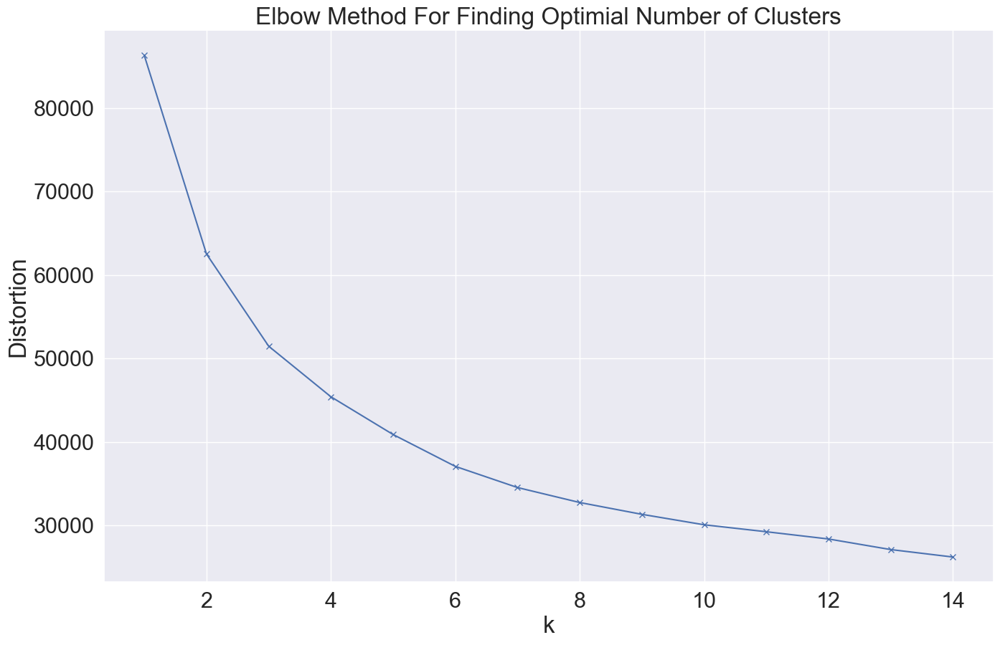

In [22]:
## Perform KMeans for various k's and record distortion -> apply Elbow Method
# distortion: the average of the squared distances from each observation to the centroid

distortions = []
K = range(1,15)
for k in K:
    # Instantiating the model
    kmeans=KMeans(n_clusters=k)
    kmeans.fit(ny_merged_scaled)
    distortions.append(kmeans.inertia_)
    
# Setting the font size
plt.rcParams['font.size'] = '2'

plt.figure(figsize=(10,5))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('Elbow Method For Finding Optimial Number of Clusters')
plt.show()

In [23]:
# Running the KMeans model with 5 clusters
kmeans=KMeans(n_clusters=5)
kmeans_5 = kmeans.fit(ny_merged_scaled)

# Printing the cluster labels
kmeans_5.labels_

array([0, 0, 1, ..., 4, 0, 4], dtype=int32)

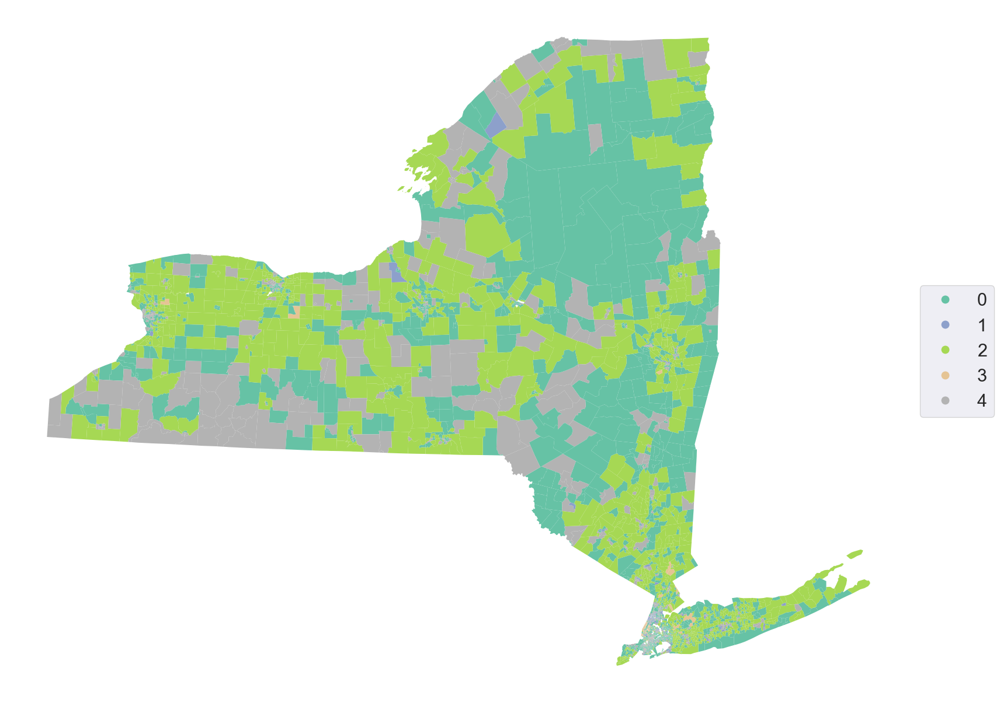

In [24]:
## Visualize cluster ids on map for New York cencus tracts

# Assign labels to a new column called km_5_label
ny_merge_2["kmeans_5_label"] = kmeans_5.labels_

# Setup figure and axis
f, ax = plt.subplots(1, figsize=(10, 10))

# Plot the choropleth map
ny_merge_2.plot(
    column="kmeans_5_label", categorical=True, legend=True, linewidth=0, ax=ax, 
    legend_kwds={'loc': 'center left','bbox_to_anchor':(1,0.5),'fmt': "{:.0f}"},
    cmap="Set2",
)

# Remove the axis
ax.set_axis_off()

# Display the map
plt.show()

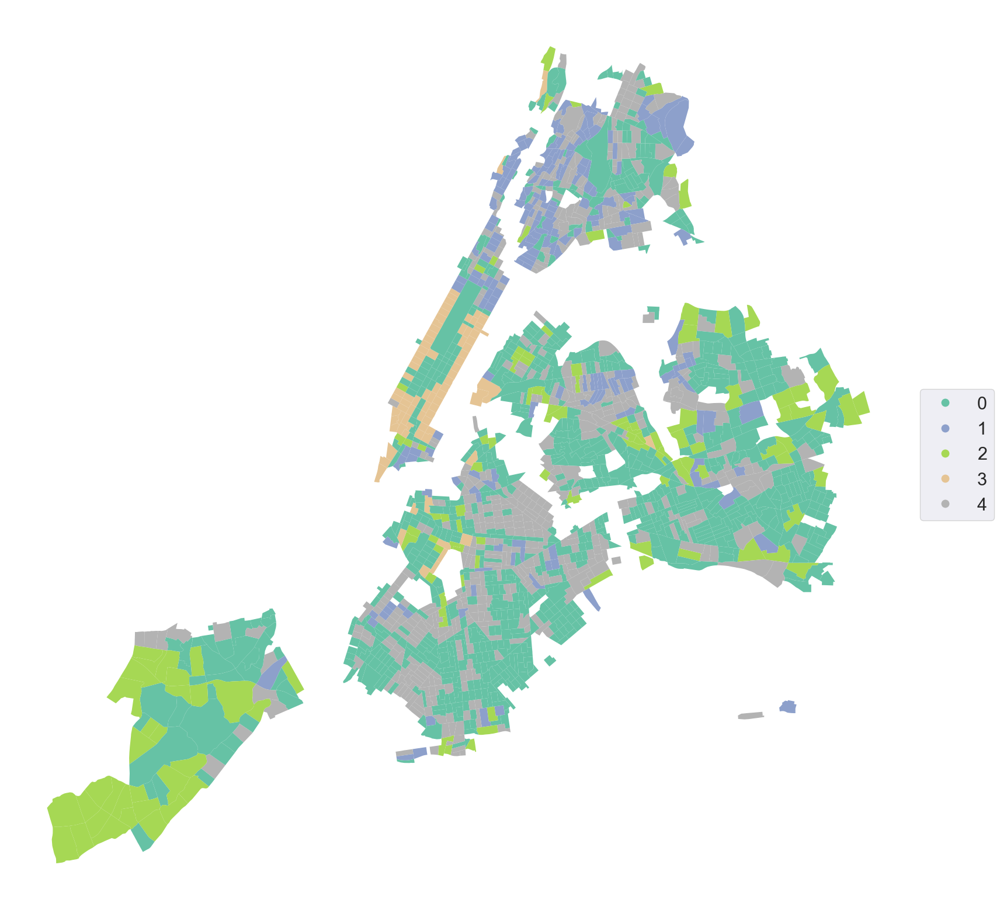

In [25]:
## Visualize for boroughs (zoom in)

# Setting the file path
path = '../Data/Data_pt1/'

ny_merge_3 = ny_merge_2.to_crs('EPSG:4326')

boroughs = gpd.read_file(path + "NYC Boroughs/nybb_22a/nybb.shp")
boroughs = boroughs.to_crs('EPSG:4326')
boroughs = boroughs.dissolve()

ny_merge_3_mask = ny_merge_3.within(boroughs.loc[0,'geometry'])

ny_merge_4 = ny_merge_3.loc[ny_merge_3_mask]



# Setup figure and axis
f, ax = plt.subplots(1, figsize=(10, 10))

# Plot the choropleth map
ny_merge_4.plot(
    column="kmeans_5_label", categorical=True, legend=True, linewidth=0, ax=ax, 
    legend_kwds={'loc': 'center left','bbox_to_anchor':(1,0.5),'fmt': "{:.0f}"},
    cmap="Set2",
)

# Remove the axis
ax.set_axis_off()

# Display the map
plt.show()

#### Cluster Profiling
* calculating descriptive statistics to describe the differences and similarities of each cluster

In [26]:
## calculate the number of census tracts that fall within each of the clusters

# Group data table by cluster label and count observations
k5distr = ny_merge_2.groupby("kmeans_5_label").size()
k5distr

kmeans_5_label
0    2067
1     273
2    1223
3     136
4    1155
dtype: int64

[Axis(name=Easting, abbrev=X, direction=east, unit_auth_code=EPSG, unit_code=9003, unit_name=US survey foot), Axis(name=Northing, abbrev=Y, direction=north, unit_auth_code=EPSG, unit_code=9003, unit_name=US survey foot)]

The area of the clusters is: kmeans_5_label
0    19728.656066
1      188.829626
2    18405.443200
3      101.947569
4    10925.962862
Name: area, dtype: float64


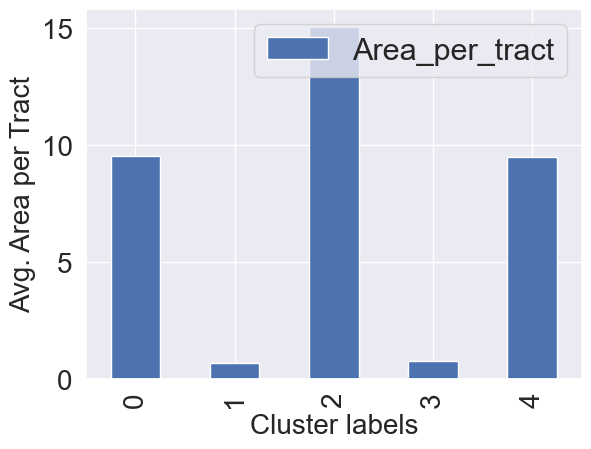

In [27]:
## calculate average area of the tracts that fall within each of the clusters

# Getting the unit of measurement from the CRS
print(ny_merge_2.crs.axis_info)

# Calculate the average area of each cluster
# 1. Create a new column with the area of the census tract and convert from foot to sq. mi. 
ny_merge_2['area'] = (ny_merge_2.geometry.area)*3.587E-8

# 2. Dissolve the tracts and caluculate the area
area = ny_merge_2.dissolve(by="kmeans_5_label", aggfunc="sum")["area"]
print("\nThe area of the clusters is: {}".format(area))

# 3. Create a table with the number of tracts per cluster and the sum area
tract_area = pd.DataFrame({"Num. Tracts": k5distr, "Area": area})
tract_area['Area_per_tract'] = tract_area["Area"]/tract_area["Num. Tracts"]
tract_area.reset_index(inplace=True)

# 4. Plot the area per tract
ax = tract_area.plot.bar(x="kmeans_5_label",y="Area_per_tract")

# Setting size of the labels
plt.xlabel('Cluster labels', fontsize=20)
plt.ylabel('Avg. Area per Tract', fontsize=20)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.show()

In [28]:
## Calculating descriptive statistics (mean) for each cluster
k5means = ny_merge_2.groupby("kmeans_5_label")[geo_demo_rn].mean()

# Transpose the table and rounding the values to 2 decimal places
k5means.round(2)

,TotPop,TotPopOccUnits,TotNumOwnOccUnit,TotNumRentOccUnit,PopLTHSDip,PopHSDip,PopAssoc,PopBA,PopGrad,PopIncLT10,...,PopInc1525,PopInc2535,PopInc3550,PopInc5065,PopInc6575,PopIncGT75,UnempPop,RetPop,RetPopNoRetInc,PopBlwPovLvl
kmeans_5_label,,,,,,,,,,,,,,,,,,,,,
0,2475.16,2369.89,1510.70,859.19,195.91,444.25,423.85,370.41,292.50,290.87,...,237.88,198.60,228.34,188.95,79.51,392.56,62.34,190.04,725.20,48.99
1,7325.46,7187.30,1282.72,5904.59,1394.37,1364.05,1067.07,691.52,369.70,1109.38,...,857.99,622.01,583.42,386.36,153.75,449.12,306.75,308.92,2262.10,388.35
2,5483.77,5382.67,4200.33,1182.34,292.76,994.99,1050.50,865.73,716.69,551.80,...,513.01,453.55,549.65,472.43,213.97,998.62,116.38,518.53,1554.25,64.22
3,7337.55,7151.98,2814.91,4337.07,209.98,424.15,620.90,2214.71,2314.00,545.86,...,407.32,345.07,463.15,536.78,284.10,3016.41,159.97,500.46,3177.30,53.30
4,4114.07,3968.54,1596.36,2372.18,540.60,845.08,668.10,420.33,250.37,557.47,...,474.80,367.96,374.41,263.10,95.55,319.06,133.11,236.33,1247.95,161.79


In [29]:
## Plot radial / spider plot

import plotly.io as pio
pio.renderers.default = 'iframe'

# Creating a dataframe version of the scaled data
ny_merged_scaled_df = pd.DataFrame(ny_merged_scaled,
                  columns = geo_demo_rn)

# Adding in the cluster labels
ny_merged_scaled_df["kmeans_5_label"] = kmeans_5.labels_

# Calculating descriptive statistics for each cluster
k5means_s = ny_merged_scaled_df.groupby("kmeans_5_label")[geo_demo_rn].mean()

# Transpose the table and rounding the values to 2 decimal places
k5means_s.round(2)

import plotly.graph_objects as go

categories = k5means_s.columns
fig = go.Figure()

for g in k5means_s.index:
    fig.add_trace(go.Scatterpolar(
        r = k5means_s.loc[g].values,
        theta = categories,
        fill = 'toself',
        name = f'cluster #{g}'
    ))

fig.update_layout(
  polar=dict(
    radialaxis=dict(
      visible=True,
      range=[-2, 5] # here we can define the range
    )),
  showlegend=True,
    title="KMeans Cluster Radial Plot",
    title_x=0.5
)

fig.show()

---

### 2. Hierarchical Clustering w/o Spatial Constraint

* __Agglomerative hierarchichal clustering (AHC):__ begins with each observation in its own cluster and recursively merges pairs of clusters together based on a linkage metric
* minimizes within-cluster variance and maximizes between-cluster variance

In [30]:
# Importing the package needed for hierarchical clustering
from sklearn.cluster import AgglomerativeClustering

# Set seed for reproducibility
np.random.seed(54321)

In [31]:
# Instantiate the algorithm
model = AgglomerativeClustering(linkage="ward", n_clusters=5)

# Run clustering
model.fit(ny_merged_scaled)

# Assign labels to main dataframe
ny_merge_2["ward5_label"] = model.labels_

# Assign labels to scaled dataframe
ny_merged_scaled_df["ward5_label"] = model.labels_

# show cluster sizes
ward5sizes = ny_merge_2.groupby("ward5_label").size()
ward5sizes

ward5_label
0    1784
1     920
2     412
3      82
4    1656
dtype: int64

In [32]:
## radial plot - cluster profiling

ward5means_s = ny_merged_scaled_df.groupby("ward5_label")[geo_demo_rn].mean()

# Transpose the table and rounding the values to 2 decimal places
ward5means_s.round(2)

categories = ward5means_s.columns
fig = go.Figure()

for g in ward5means_s.index:
    fig.add_trace(go.Scatterpolar(
        r = ward5means_s.loc[g].values,
        theta = categories,
        fill = 'toself',
        name = f'cluster #{g}'
    ))

fig.update_layout(
  polar=dict(
    radialaxis=dict(
      visible=True,
      range=[-2, 6] # here we can define the range
    )),
  showlegend=True,
    title="AHC Cluster Radial Plot",
    title_x=0.5
)

fig.show()

#### Comparing KNN to AHC - choropleth maps

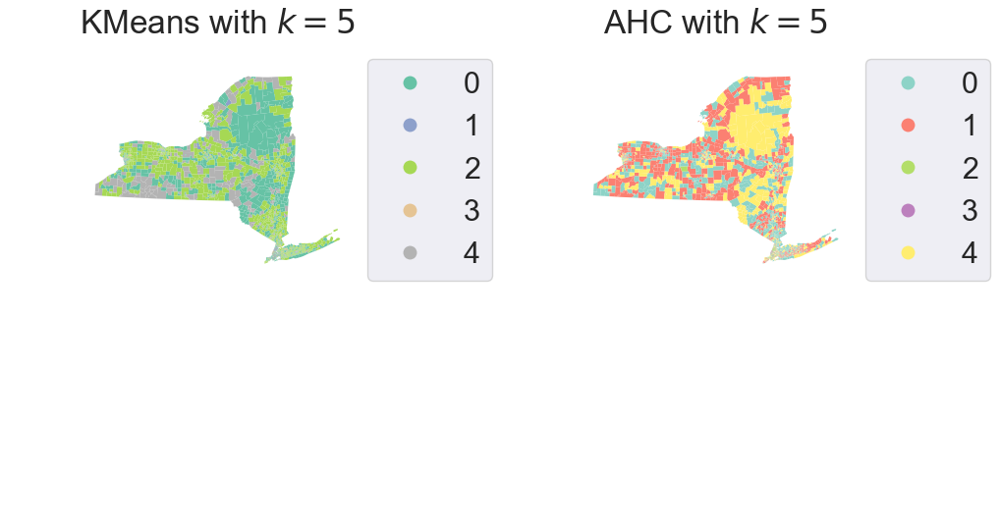

In [33]:
# Setup figure and ax
fig, axs = plt.subplots(2, 2, figsize=(12, 6))

# Plotting the k-means map
ax = axs[0,0]
# Plot the choropleth map of the k-means results
ny_merge_2.plot(
    column="kmeans_5_label",
    categorical=True,
    cmap="Set2",
    legend=True,
    legend_kwds={'loc': 'center left','bbox_to_anchor':(1,0.5),'fmt': "{:.0f}"},
    linewidth=0,
    ax=ax,
)
# Remove the axis
ax.set_axis_off()

# Add the title
ax.set_title("KMeans with $k=5$")


# Plot the choropleth map of the Agglomerative Hierarchical Clustering results
ax = axs[0,1]

ny_merge_2.plot(
    column="ward5_label",
    categorical=True,
    cmap="Set3",
    legend=True,
    legend_kwds={'loc': 'center left','bbox_to_anchor':(1,0.5),'fmt': "{:.0f}"},
    linewidth=0,
    ax=ax,
)
# Remove the axis
ax.set_axis_off()

# Add the title
ax.set_title("AHC with $k=5$")

# Deleting the empty axis
axs[1,0].set_axis_off()
axs[1,1].set_axis_off()

# Display the map
plt.show()

---

## Spatially Constrained Clustering - Regionalization

* when we require clusters to be spatially connected (e.g., real estate)
* need to decide on __spatial weights matrix__
* _connectivity_ parameter is set to _spatial weights matrix_

### Hierarchical Clustering w/ Spatial Constraint

In [34]:
## calculate spatial weights matrix - QUEEN
w = Queen.from_dataframe(ny_merge_2)

In [35]:
# Set the seed for reproducibility
np.random.seed(54321)

# Specify cluster model with a spatial constraint. Constraint is passed using connectivity parameter. 
model = AgglomerativeClustering(
    linkage="ward", connectivity=w.sparse, n_clusters=5
)
# Fit the algorithm to the data
model.fit(ny_merged_scaled)

# Assign the labels to dataframe
ny_merge_2["ward5wgt_label"] = model.labels_

# Assign labels to the scaled dataframe
ny_merged_scaled_df["ward5wgt_label"] = model.labels_

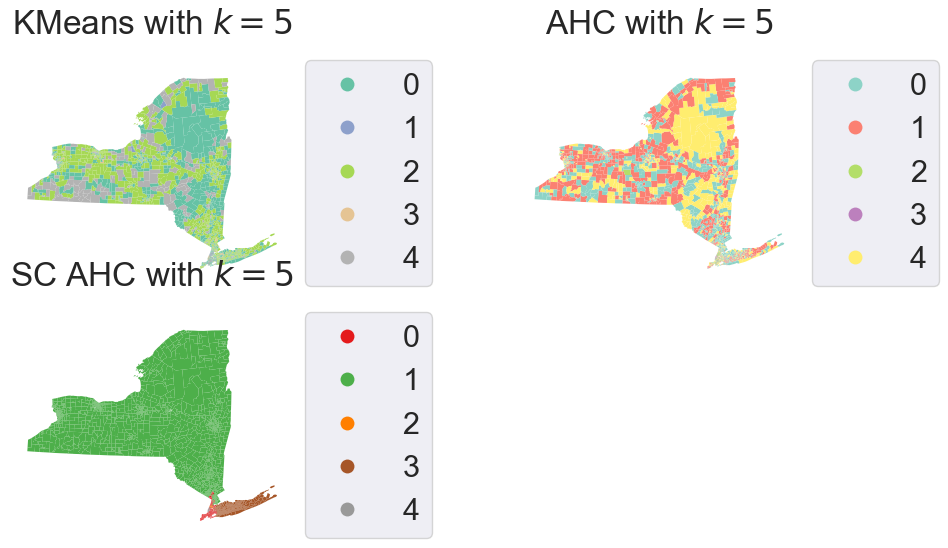

In [36]:
# Setup figure and ax
fig, axs = plt.subplots(2, 2, figsize=(12, 6))

# Plotting the k-means map
ax = axs[0,0]
# Plot the choropleth map of the k-means results
ny_merge_2.plot(
    column="kmeans_5_label",
    categorical=True,
    cmap="Set2",
    legend=True,
    legend_kwds={'loc': 'center left','bbox_to_anchor':(1,0.5),'fmt': "{:.0f}"},
    linewidth=0,
    ax=ax,
)
# Remove the axis
ax.set_axis_off()

# Add the title
ax.set_title("KMeans with $k=5$")


# Plot the choropleth map of the Agglomerative Hierarchical Clustering results
ax = axs[0,1]

ny_merge_2.plot(
    column="ward5_label",
    categorical=True,
    cmap="Set3",
    legend=True,
    legend_kwds={'loc': 'center left','bbox_to_anchor':(1,0.5),'fmt': "{:.0f}"},
    linewidth=0,
    ax=ax,
)
# Remove the axis
ax.set_axis_off()

# Add the title
ax.set_title("AHC with $k=5$")


# Plot the choropleth map of the Spatially Constrained Agglomerative Hierarchical Clustering results
ax = axs[1, 0]

ny_merge_2.plot(
    column="ward5wgt_label",
    categorical=True,
    cmap="Set1",
    legend=True,
    legend_kwds={'loc': 'center left','bbox_to_anchor':(1,0.5),'fmt': "{:.0f}"},
    linewidth=0,
    ax=ax,
)
# Remove the axis
ax.set_axis_off()

# Add the title
ax.set_title("SC AHC with $k=5$")

# Deleting the empty axis
axs[1,1].set_axis_off()

# Display the map
plt.show()

In [37]:
# Plot the radial plots for the spatially constrained models
ward5_wgt_means_s = ny_merged_scaled_df.groupby("ward5wgt_label")[geo_demo_rn].mean()

# Transpose the table and rounding the values to 2 decimal places
ward5_wgt_means_s.round(2)

categories = ward5_wgt_means_s.columns
fig = go.Figure()

for g in ward5_wgt_means_s.index:
    fig.add_trace(go.Scatterpolar(
        r = ward5_wgt_means_s.loc[g].values,
        theta = categories,
        fill = 'toself',
        name = f'cluster #{g}'
    ))

fig.update_layout(
  polar=dict(
    radialaxis=dict(
      visible=True,
      range=[-2, 6] # here we can define the range
    )),
  showlegend=True,
    title="SCAHC Cluster Radial Plot",
    title_x=0.5
)

fig.show()

#### Using a different spatial weights matrix

In [38]:
# Calculate spatial weights matrix - KNN
w = KNN.from_dataframe(ny_merge_2, k=10)

In [39]:
# Setting the seed for reproducibility
np.random.seed(54321)

# Specifying the cluster model with KNN spatial constraint
model = AgglomerativeClustering(
    linkage="ward", connectivity=w.sparse, n_clusters=5
)
# Fitting the algorithm to the data
model.fit(ny_merged_scaled)

# Assigning the labels to dataframe
ny_merge_2["ward5_knnwgt_label"] = model.labels_

# Assigning labels to scaled dataframe
ny_merged_scaled_df["ward5_knnwgt_label"] = model.labels_

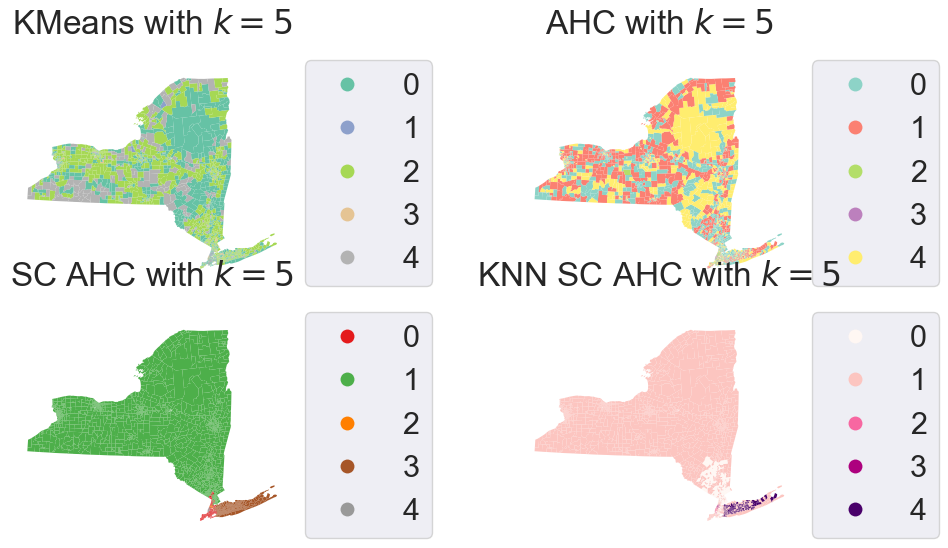

In [40]:
# Setup figure and ax
f, axs = plt.subplots(2, 2, figsize=(12, 6))

# Plotting the k-means map
ax = axs[0,0]
# Plot the choropleth map of the k-means results
ny_merge_2.plot(
    column="kmeans_5_label",
    categorical=True,
    cmap="Set2",
    legend=True,
    legend_kwds={'loc': 'center left','bbox_to_anchor':(1,0.5),'fmt': "{:.0f}"},
    linewidth=0,
    ax=ax,
)
# Remove the axis
ax.set_axis_off()

# Add the title
ax.set_title("KMeans with $k=5$")


# Plot the choropleth map of the Agglomerative Hierarchical Clustering results
ax = axs[0,1]

ny_merge_2.plot(
    column="ward5_label",
    categorical=True,
    cmap="Set3",
    legend=True,
    legend_kwds={'loc': 'center left','bbox_to_anchor':(1,0.5),'fmt': "{:.0f}"},
    linewidth=0,
    ax=ax,
)
# Remove the axis
ax.set_axis_off()

# Add the title
ax.set_title("AHC with $k=5$")


# Plot the choropleth map of the Spatially Constrained Agglomerative Hierarchical Clustering results
ax = axs[1, 0]

ny_merge_2.plot(
    column="ward5wgt_label",
    categorical=True,
    cmap="Set1",
    legend=True,
    legend_kwds={'loc': 'center left','bbox_to_anchor':(1,0.5),'fmt': "{:.0f}"},
    linewidth=0,
    ax=ax,
)
# Remove the axis
ax.set_axis_off()

# Add the title
ax.set_title("SC AHC with $k=5$")

### KNN SC_AHC ###
ax = axs[1,1]

# Plot the choropleth map of the KNN SC AHC results
ny_merge_2.plot(
    column="ward5_knnwgt_label",
    categorical=True,
    cmap="RdPu",
    legend=True,
    legend_kwds={'loc': 'center left','bbox_to_anchor':(1,0.5),'fmt': "{:.0f}"},
    linewidth=0,
    ax=ax,
)
# Remove the axis
ax.set_axis_off()

# Add the title
ax.set_title("KNN SC AHC with $k=5$")

# Display the map
plt.show()

In [41]:
ward5_knnwgt_s = ny_merged_scaled_df.groupby("ward5_knnwgt_label")[geo_demo_rn].mean()

# Transpose the table and rounding the values to 2 decimal places
ward5_knnwgt_s.round(2)

categories = ward5_knnwgt_s.columns
fig = go.Figure()

for g in ward5_knnwgt_s.index:
    fig.add_trace(go.Scatterpolar(
        r = ward5_knnwgt_s.loc[g].values,
        theta = categories,
        fill = 'toself',
        name = f'cluster #{g}'
    ))

fig.update_layout(
  polar=dict(
    radialaxis=dict(
      visible=True,
      range=[-2, 6] # here we can define the range
    )),
  showlegend=True,
    title="KNN Cluster Radial Plot",
    title_x=0.5
)

fig.show()

---

## 6. Model Performance
* Calinski-Harabasz score (higher = better performing)
* Davie-Bouldin score (lower = better performing)
* Silhouette score (higher = better performing)

In [42]:
from sklearn.metrics import calinski_harabasz_score, davies_bouldin_score, silhouette_score

ch_scores = []
db_scores = []
s_scores = []

In [43]:
# calculate performance scores for four models

for model in ("kmeans_5_label", "ward5_label", "ward5wgt_label", "ward5_knnwgt_label"):
    # compute the CH score
    ch_score = calinski_harabasz_score(
        ny_merged_scaled_df[geo_demo_rn],
        ny_merged_scaled_df[model],
    )
    ch_scores.append((model, ch_score))
    
    # compute the DB score
    db_score = davies_bouldin_score(
        ny_merged_scaled_df[geo_demo_rn],
        ny_merged_scaled_df[model],
    )
    db_scores.append((model, db_score))
    
    # compute the silhouette score
    s_score = silhouette_score(
        ny_merged_scaled_df[geo_demo_rn],
        ny_merged_scaled_df[model],
    )
    s_scores.append((model, s_score))

In [44]:
# create a dataframe from the scores
ch_df = pd.DataFrame(
    ch_scores, columns=["model", "CH Score"]
).set_index("model")
db_df = pd.DataFrame(
    db_scores, columns=["model", "DB Score"]
).set_index("model")
s_df = pd.DataFrame(
    s_scores, columns=["model", "Silhouette Score"]
).set_index("model")

# Merging into a combined dataframe
scores_df = ch_df.merge(db_df, on="model")
scores_df = scores_df.merge(s_df, on="model")

# displaying the dataframe
scores_df

,CH Score,DB Score,Silhouette Score
model,,,
kmeans_5_label,1347.408714,1.374133,0.236269
ward5_label,1162.354263,1.537564,0.174232
ward5wgt_label,281.127146,3.197320,0.009202
ward5_knnwgt_label,446.275674,2.082529,0.123112


_Interpretation:_ The models without spatial constraints are performing better.